## Running Analysis

Analysis around my running performance, using Pandas, Plotly for gaining experience.

In [1]:
import pandas as pd
import numpy as np

import plotly
import plotly.plotly as py
import plotly.graph_objs as go

import datetime as dt

import sklearn as sk
from sklearn import linear_model
from sklearn import ensemble

/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning:

numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.



In [2]:
print('NumPy: ' + np.__version__)
print('Pandas: ' + pd.__version__)
print('Plotly: ' + plotly.__version__)
print("Scikit: " + sk.__version__)

NumPy: 1.16.2
Pandas: 0.22.0
Plotly: 3.1.1
Scikit: 0.19.1


### Data Load and Inspection

Load the runs data set and look at sample values.

In [3]:
data = pd.read_csv('./data/running.csv')

In [4]:
data.head(5)

,Date,Week,DistanceMiles,TimeMinutes,Speed,AverageHeartRate,MarathonTime,Comment
0,31 May 19,NaN,5.00,45.7,NaN,156.0,NaN,NaN
1,27 May 19,NaN,4.04,38.8,NaN,165.0,NaN,Watch Outdoors Hills
2,26 May 19,NaN,7.09,75.1,NaN,169.0,NaN,Watch Outdoors Hills
3,23 May 19,NaN,4.00,37.4,NaN,156.0,NaN,NaN
4,21 May 19,NaN,1.80,17.8,NaN,148.0,NaN,NaN


In [5]:
data.describe()

,Week,DistanceMiles,TimeMinutes,Speed,AverageHeartRate,MarathonTime
count,209.000000,224.000000,224.000000,209.000000,208.000000,209.000000
mean,24.688995,5.365893,54.617768,5.897225,156.355769,266.314354
std,13.368804,3.170970,33.207101,0.328670,7.181455,22.415724
min,1.000000,1.500000,15.300000,4.940000,143.000000,27.500000
25%,13.000000,3.200000,33.000000,5.690000,151.000000,257.000000
50%,24.000000,4.045000,42.055000,5.880000,155.500000,267.300000
75%,36.000000,6.680000,67.575000,6.110000,161.000000,276.400000
max,50.000000,26.200000,279.900000,6.870000,177.000000,318.400000


In [6]:
data['Comment'].unique()

array([nan, 'Watch Outdoors Hills', 'Watch Outdoors', 'Break',
       'Interval Break', 'Interval', 'Interval Hills', 'Hills',
       'Hills Break', 'Marathon', 'Outdoors', 'Hills Break Outdoors',
       'Hills Outdoors'], dtype=object)

### Data Cleanup

Some cleanup is needed for
- removing converting values,
- removing unnecessary columns, 
- plitting the comment into indicator columns (hills, interval training, outdoor etc)
- impute missing speed values

In [7]:
data = data.drop(['Week', 'MarathonTime','Speed'], axis=1)

In [8]:
# Comment has some empty values that are parsed as na
data['Comment'] = data['Comment'].fillna('')

# Split out indicators
data = data.assign(Hills=lambda df: df.Comment.str.contains('Hills'))
data = data.assign(IntervalTraining=lambda df: df.Comment.str.contains('Interval'))
data = data.assign(Outdoors=lambda df: df.Comment.str.contains('Outdoors'))
data = data.assign(Break=lambda df: df.Comment.str.contains('Break'))

# Convert date from string to real dates and also add Week column
data['Date'] = data['Date'].map(lambda str: dt.datetime.strptime(str,'%d %b %y').date())
data['Week'] = data['Date'].map(lambda d: d.strftime('%Y.%W'))

# Fill in speed in case of missing observations
data['Speed'] = (data['DistanceMiles'] / data['TimeMinutes'] * 60).round(2)

In [9]:
data.head(5)

,Date,DistanceMiles,TimeMinutes,AverageHeartRate,Comment,Hills,IntervalTraining,Outdoors,Break,Week,Speed
0,2019-05-31,5.00,45.7,156.0,,False,False,False,False,2019.21,6.56
1,2019-05-27,4.04,38.8,165.0,Watch Outdoors Hills,True,False,True,False,2019.21,6.25
2,2019-05-26,7.09,75.1,169.0,Watch Outdoors Hills,True,False,True,False,2019.20,5.66
3,2019-05-23,4.00,37.4,156.0,,False,False,False,False,2019.20,6.42
4,2019-05-21,1.80,17.8,148.0,,False,False,False,False,2019.20,6.07


### Some Basic Visualization

In [10]:
plotly.offline.init_notebook_mode()

In [11]:
weekdf = data[['Week', 'DistanceMiles']].groupby(by='Week').agg({
    'DistanceMiles':np.sum})

In [12]:
figure = go.Figure(
  data=[go.Scatter(
          x=weekdf.index,
          y=weekdf['DistanceMiles'])],
  layout=go.Layout(
          xaxis=dict(autorange=True, type='category'),
          title="Weekly Distance Ran (miles)"))

plotly.offline.iplot(
    figure,
    filename='weekly-distance')

In [13]:
# Introduce bucketed distance and speeds
df2 = data.copy()
df2['DistanceBucket'] = df2['DistanceMiles'].round()
df2['SpeedBucket'] = df2['Speed'].round(1)

In [14]:
# Pivot data to see average heart rate by distance and speed
pivot = pd.pivot_table(df2, 
                       values='AverageHeartRate', 
                       index=['SpeedBucket'], 
                       columns=['DistanceBucket'], 
                       aggfunc=np.average).sort_index(ascending=True)

In [15]:
trace = go.Heatmap(
  x = pivot.columns,
  y = pivot.index,
  z = [tuple(x) for x in pivot.values],
  colorscale = 'YlOrRd',
  reversescale = True)

figure = go.Figure(
  data=[trace],
  layout = go.Layout(title="Average Heart Rate by Speed and Distance"))

plotly.offline.iplot(figure, filename="heartrate-heatmap")

### Finally Some Prediction

#### Linear Models

Try out a simple linear regression model to figure out trends and sensitivity to different variables. First let's drop some incomplete data that causes issues in fitting.

To start with no validation set is held back as the exercise is to see what kind of features may be useful for explanation.

In [16]:
cleandata = data.dropna()

Initial linear regression model using only distance and speed.

In [17]:
lm = linear_model.LinearRegression()
params = ['DistanceMiles','Speed']
model = lm.fit(cleandata[params], cleandata['AverageHeartRate'])
lm.score(cleandata[params], cleandata['AverageHeartRate'])


0.315730227058051

R^2=0.31 not great. Let's try some more parameters.

In [18]:
# Generate a numeric date to indicate length of training.
cleandata = cleandata.assign(DateNum=lambda df: df['Date'].map(lambda d: d.toordinal()))

lm = linear_model.LinearRegression()
params = ['DistanceMiles','Speed','DateNum','Hills','Break','Outdoors']
model = lm.fit(cleandata[params], cleandata['AverageHeartRate'])
lm.score(cleandata[params], cleandata['AverageHeartRate'])


0.4467095746475891

R^2=0.45 a bit better but still not much better. The parameters seem to show a decent enough impact from all parameters. Particularly

- About 1 beat/minute for one extra mile of total distance
- About 5 beats/minute for running outdoors (why? potentially this is confounded with higher heat)
- About 9 beats/minute for every 1 mph faster
- About -0.02 beats/minute for every day of training
- About -2 beats/minute for having any breaks during training
- About -0.3 beats/minute for running hills (why? this seems wrong)

In [19]:
dict(zip(params,lm.coef_))

{'Break': -2.1029911411310445,
 'DateNum': -0.01727722360102279,
 'DistanceMiles': 0.8454569333114785,
 'Hills': 0.307277793302485,
 'Outdoors': 6.567767633992015,
 'Speed': 8.15179641077717}

#### Further Investigation

Some more data points to improve accuracy ... cumulative distance pre-dating the run, days rest, non-linear speed term.

In [20]:
cleandata = cleandata.assign(SpeedSquared=lambda df: df['Speed']*df['Speed'])

cleandata['Distance30Days'] = cleandata['DateNum'] \
  .map(lambda x: cleandata[np.logical_and(cleandata.DateNum >= x-30, cleandata.DateNum < x)]) \
  .map(lambda rows: rows['DistanceMiles'].sum())

cleandata['Distance10Days'] = cleandata['DateNum'] \
  .map(lambda x: cleandata[np.logical_and(cleandata.DateNum >= x-10, cleandata.DateNum < x)]) \
  .map(lambda rows: rows['DistanceMiles'].sum())

cleandata['Distance3Days'] = cleandata['DateNum'] \
  .map(lambda x: cleandata[np.logical_and(cleandata.DateNum >= x-3, cleandata.DateNum < x)]) \
  .map(lambda rows: rows['DistanceMiles'].sum())

cleandata['DaysRest'] = cleandata['DateNum'] \
  .map(lambda x: x - cleandata[cleandata.DateNum < x].DateNum.max()) \
  .fillna(0.0)

cleandata['Month'] = cleandata['Date'].map(lambda d: d.month)
cleandata['ColdMonth'] = np.logical_or(cleandata['Month'] >= 12, cleandata['Month'] <= 2)
cleandata['HotMonth'] = np.logical_and(cleandata['Month'] >= 6, cleandata['Month'] <= 8)

In [21]:
lm = linear_model.LinearRegression()
params = ['DistanceMiles','Distance3Days','Distance10Days','Distance30Days','Speed','DateNum',
          'DaysRest', 'ColdMonth', 'HotMonth',
          'Hills','Break','Outdoors','SpeedSquared','IntervalTraining']
model = lm.fit(cleandata[params], cleandata['AverageHeartRate'])

print("R^2: "+str(lm.score(cleandata[params], cleandata['AverageHeartRate'])))
print(dict(zip(params,lm.coef_)))

R^2: 0.5869805432176658
{'DistanceMiles': 0.8666789248200147, 'Distance3Days': -0.03837194607080888, 'Distance10Days': -0.1095614815468515, 'Distance30Days': -0.05797892304437968, 'Speed': -5.622505515904173, 'DateNum': -0.015374974480143688, 'DaysRest': -0.2963469525122071, 'ColdMonth': -0.5120444517126872, 'HotMonth': -2.6946744915158445, 'Hills': 0.3851825441650478, 'Break': -2.207126826892317, 'Outdoors': 7.247333846487565, 'SpeedSquared': 0.8719026151302969, 'IntervalTraining': 3.9407853678967943}


Paring back the parameters to the ones with the most impact:

In [22]:
lm = linear_model.LinearRegression()
params = ['DistanceMiles','Distance30Days','Speed', 'DateNum','Break','Outdoors','IntervalTraining']
model = lm.fit(cleandata[params], cleandata['AverageHeartRate'])

print("R^2: "+str(lm.score(cleandata[params], cleandata['AverageHeartRate'])))
print(dict(zip(params,lm.coef_)))

R^2: 0.5521085984114126
{'DistanceMiles': 0.82073191758557, 'Distance30Days': -0.09061165780309825, 'Speed': 5.461521683573133, 'DateNum': -0.012806349037986848, 'Break': -1.9117686047426998, 'Outdoors': 7.738687589402505, 'IntervalTraining': 4.483220888353904}


Most of the additional accuracy seems to come from adding the total mileage over the last 30 days. The last 3 or 10 days don't add as much or much additional explanation.

The next factor may be weight from a separate data set.

#### Random Forests

Some of the features are definitely not simply linear. For example DaysRest could have a contribution of lowering heart rate for a small number (1-2 days rest after hard workout) but an opposite impact at longer stretches without training. Similarly the training progressiong in the number of days may have an inflection point after my first marathon (or elsewhere). Finally, some variables can be related such as outdoors and date (for example running outdoors in hot summer month is harder than the gym while in cold winter the opposite may be true).

First attempt is to use a random forest classifier with the same parameters as used for the last linear regression model. Note that the n_estimators and max_leaf_nodes have to be adjusted to avoid what looks like wild overfitting of the data.

Even so all but the very tiniest random forest seem to have a better prediction than the linear model on the total data.



In [23]:
rf = ensemble.RandomForestRegressor(n_estimators=3, max_leaf_nodes=10)
params = ['DistanceMiles','Distance30Days','Speed',
          'Month','ColdMonth','HotMonth',
          'DateNum','Hills','Break','Outdoors','IntervalTraining']
rf.fit(cleandata[params], cleandata['AverageHeartRate'])

rf.score(cleandata[params], cleandata['AverageHeartRate'])

0.695323570553339

Tree number: 0


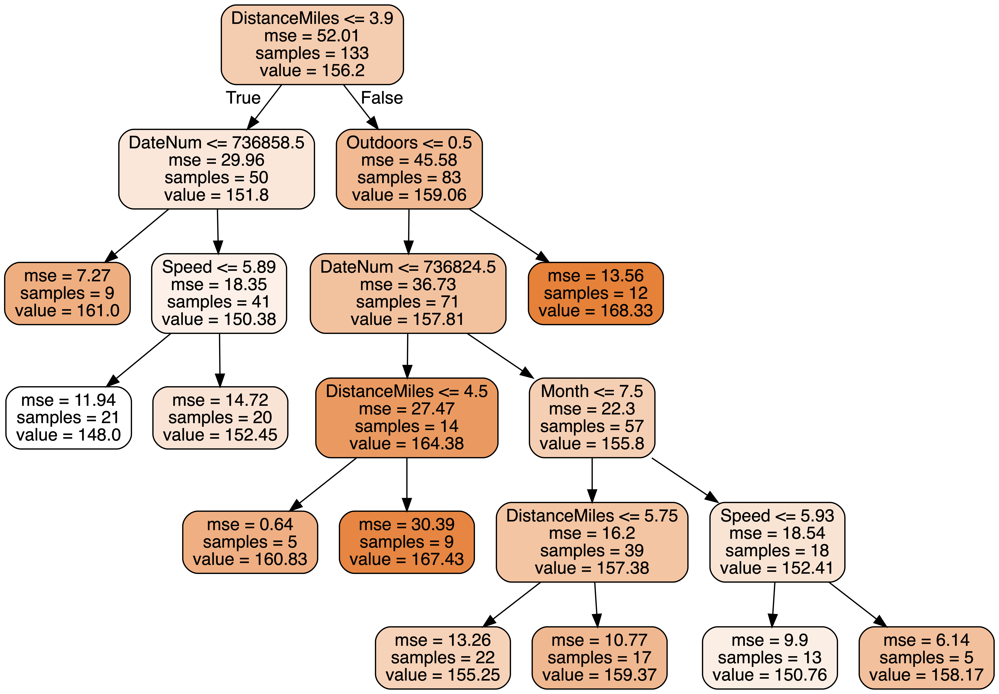

Tree number: 1


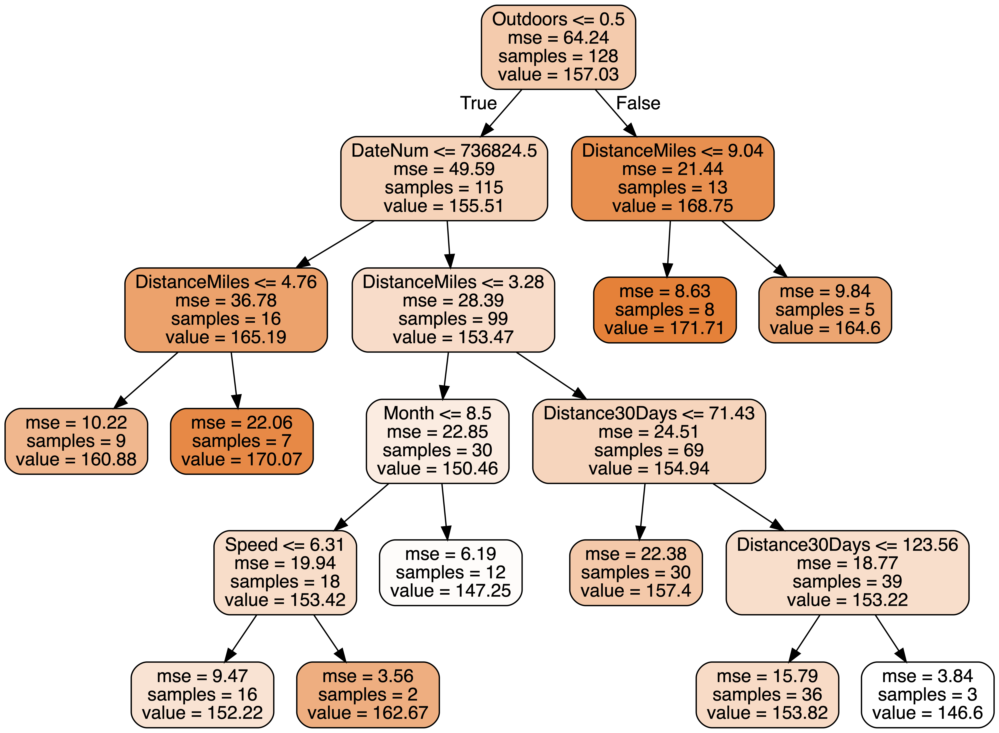

Tree number: 2


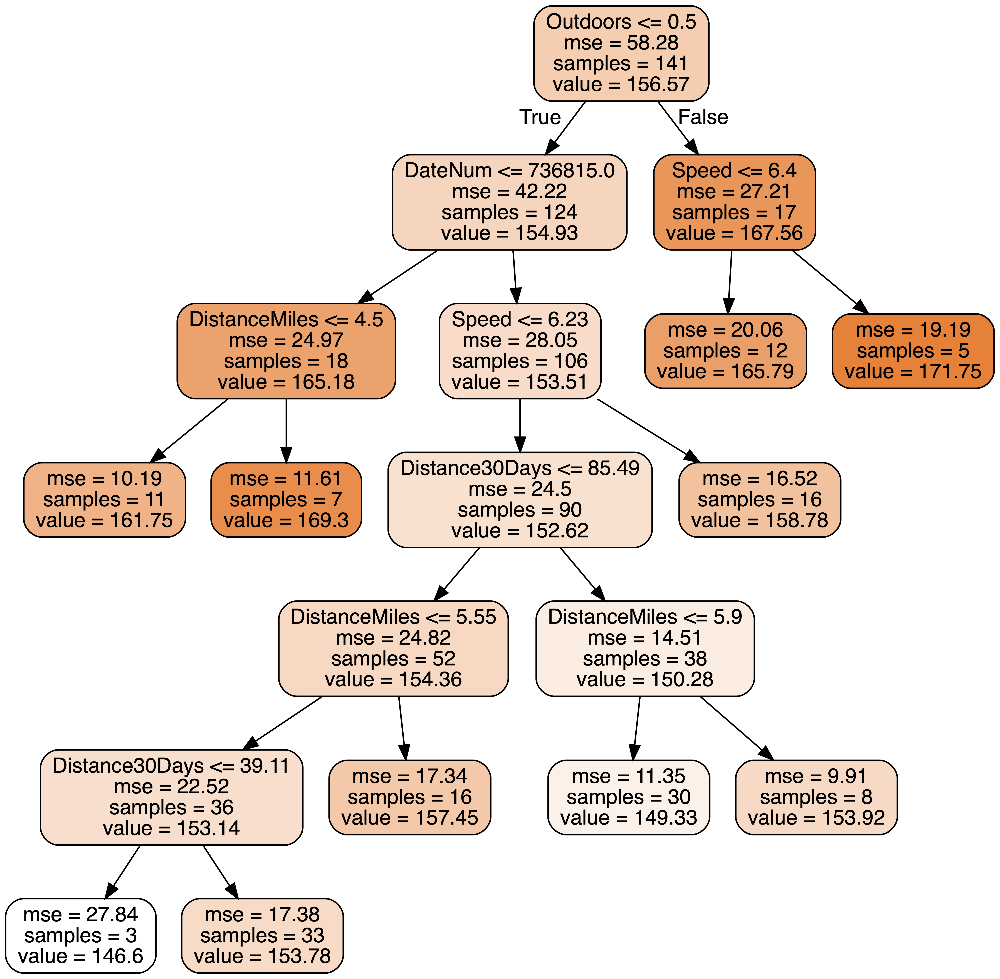

In [24]:
# Visualize tree: https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c

from sklearn.tree import export_graphviz
from subprocess import call
from IPython.display import Image, display

for i in range(3):
    estimator = rf.estimators_[i]
    export_graphviz(estimator, out_file='tree.dot', 
                    feature_names = params,
                    class_names = 'AverageHeartRate',
                    rounded = True, proportion = False, 
                    precision = 2, filled = True)

    call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

    print('Tree number: %d' % (i))
    display(Image(filename = 'tree.png'))